<a href="https://colab.research.google.com/github/AnnaPakir/cover_music/blob/main/cover_music.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Определение жанра музыкального альбома

<u>Цель исследования:</u> Создать модель, классифицирующую обложки музыкальных альбомов по жанрам.

<u>Используемые технологии</u>: torch, torchvision, matplotlib, fiass, fastai

Проект состоит из следующих частей:
- ознакомление с данными;
- предобработка данных;
- создание baseline модели;
- создание нейронной сети;
- выводы.

Загрузим необходимые библиотеки

In [ ]:
import pandas as pd
import os
import zipfile
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import tqdm
import faiss
import numpy as np
from PIL import Image
from torchvision import transforms, models
from torchvision.models import resnet50, ResNet50_Weights, resnet34
from torch.autograd import Variable
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, \
                            confusion_matrix, \
                            precision_score, \
                            f1_score, \
                            recall_score
from fastai.vision.all import *

In [ ]:
RANDOM_STATE = 42
TEST_SIZE = 0.2

In [ ]:
path = 'drive/MyDrive/cover/'

# Ознакомление с данными

Посмотрим на данные.

In [ ]:
folder = os.listdir('drive/MyDrive/cover')
print('У нас есть', len(folder),'папок с файлами:', *folder)

У нас есть 10 папок с файлами: anime black metal classical country disco edm jazz pop rap reggae


Посмотрим, что внутри папок.

В папке anime находится 1189  изображений
В папке black metal находится 450  изображений
В папке classical находится 955  изображений
В папке country находится 1486  изображений
В папке disco находится 475  изображений
В папке edm находится 719  изображений
В папке jazz находится 821  изображений
В папке pop находится 803  изображений
В папке rap находится 328  изображений
В папке reggae находится 581  изображений


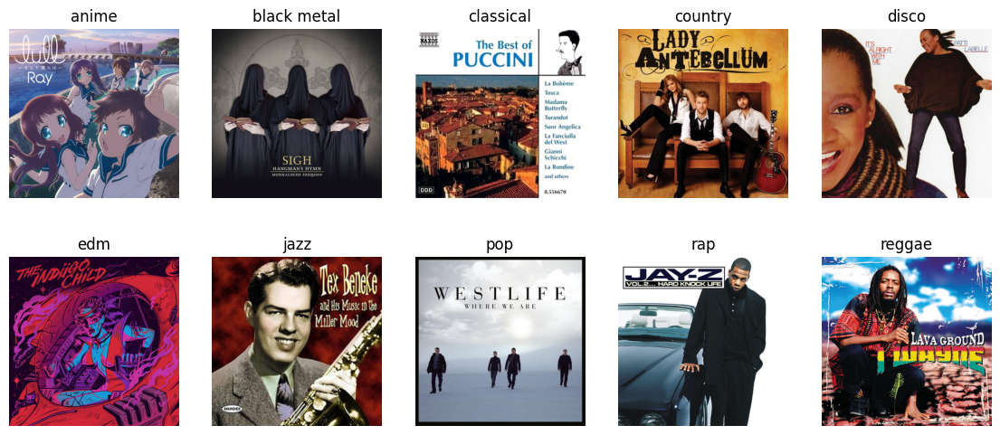

In [ ]:
fig = plt.figure(figsize=(14,6))
for i in range(len(folder)):
    file = os.listdir(path+folder[i])
    print('В папке', folder[i], 'находится', len(file),' изображений')
    filename= '{}/{}'.format(folder[i],file[1])
    plt.subplot(2,5, i+1)
    plt.imshow(Image.open(path+filename))
    plt.title(folder[i])
    plt.axis('off')
plt.show()

Видны несбалансированные классы, что необходимо будет участь при построении модели.

# Предобработка данных

Соберем датафрейм. Сделаем множествo датафреймов для экономии ОЗУ и вычислительных мощностей.

In [ ]:
def df_new(title):
    name = os.listdir(path+title)
    df=pd.DataFrame(name, columns=['name'])
    df['genre']=title
    return df

In [ ]:
anime_df = df_new('anime')
anime_df.shape

(1189, 2)

In [ ]:
metal_df = df_new('black metal')
metal_df.shape

(450, 2)

In [ ]:
classical_df = df_new('classical')
classical_df.shape

(955, 2)

In [ ]:
country_df = df_new('country')
country_df.shape

(1486, 2)

In [ ]:
disco_df = df_new('disco')
disco_df.shape

(475, 2)

In [ ]:
edm_df = df_new('edm')
edm_df.shape

(719, 2)

In [ ]:
jazz_df = df_new('jazz')
jazz_df.shape

(821, 2)

In [ ]:
pop_df = df_new('pop')
pop_df.shape

(803, 2)

In [ ]:
rap_df = df_new('rap')
rap_df.shape

(328, 2)

In [ ]:
reggae_df = df_new('reggae')
reggae_df.shape

(581, 2)

Проведем векторизацию изображений

In [ ]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [ ]:
resnet50 = models.resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)
for param in resnet50.parameters():
    param.requires_grad_(False)
layers = list(resnet50.children())[:-1]
resnet50 = torch.nn.Sequential(*layers)
resnet50.eval()

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:02<00:00, 48.7MB/s]


Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)


In [ ]:
tensor_anime = []
file = os.listdir(path+'anime')

In [ ]:
def one_anime(i):
    filename= '{}/{}'.format(path+'anime',file[i])
    img = Image.open(filename).convert('RGB')
    img1 = transform(img)
    x = torch.unsqueeze(img1, dim=0)
    y = resnet50(x).detach().numpy()
    z = y.reshape(2048)
    tensor_anime.append([z])

In [ ]:
for i in range(len(anime_df)):
    one_anime(i)
len(tensor_anime)

1189

In [ ]:
tensor_metal = []
file = os.listdir(path+'black metal')

In [ ]:
def one_metal(i):
    filename= '{}/{}'.format(path+'black metal',file[i])
    img = Image.open(filename).convert('RGB')
    img1 = transform(img)
    x = torch.unsqueeze(img1, dim=0)
    y = resnet50(x).detach().numpy()
    z = y.reshape(2048)
    tensor_metal.append([z])

In [ ]:
for i in range (len(metal_df)):
    one_metal(i)
len(tensor_metal)

450

In [ ]:
tensor_classical = []
file = os.listdir(path+'classical')

In [ ]:
def one_classical(i):
    filename= '{}/{}'.format(path+'classical',file[i])
    img = Image.open(filename).convert('RGB')
    img1 = transform(img)
    x = torch.unsqueeze(img1, dim=0)
    y = resnet50(x).detach().numpy()
    z = y.reshape(2048)
    tensor_classical.append([z])

In [ ]:
for i in range (len(classical_df)):
    one_classical(i)
len(tensor_classical)

955

In [ ]:
tensor_country = []
file = os.listdir(path+'country')

In [ ]:
def one_country(i):
    filename= '{}/{}'.format(path+'country',file[i])
    img = Image.open(filename).convert('RGB')
    img1 = transform(img)
    x = torch.unsqueeze(img1, dim=0)
    y = resnet50(x).detach().numpy()
    z = y.reshape(2048)
    tensor_country.append([z])

In [ ]:
for i in range (len(country_df)):
    one_country(i)
len(tensor_country)

1486

In [ ]:
tensor_jazz = []
file = os.listdir(path+'jazz')

In [ ]:
def one_jazz(i):
    filename= '{}/{}'.format(path+'jazz',file[i])
    img = Image.open(filename).convert('RGB')
    img1 = transform(img)
    x = torch.unsqueeze(img1, dim=0)
    y = resnet50(x).detach().numpy()
    z = y.reshape(2048)
    tensor_jazz.append([z])

In [ ]:
for i in range (len(jazz_df)):
    one_jazz(i)
len(tensor_jazz)

821

In [ ]:
tensor_pop = []
file = os.listdir(path+'pop')

In [ ]:
def one_pop(i):
    filename= '{}/{}'.format(path+'pop', file[i])
    img = Image.open(filename).convert('RGB')
    img1 = transform(img)
    x = torch.unsqueeze(img1, dim=0)
    y = resnet50(x).detach().numpy()
    z = y.reshape(2048)
    tensor_pop.append([z])

In [ ]:
for i in range (len(pop_df)):
    one_pop(i)
len(tensor_pop)

803

In [ ]:
tensor_reggae = []
file = os.listdir(path+'reggae')

In [ ]:
def one_reggae(i):
    filename= '{}/{}'.format(path+'reggae',file[i])
    img = Image.open(filename).convert('RGB')
    img1 = transform(img)
    x = torch.unsqueeze(img1, dim=0)
    y = resnet50(x).detach().numpy()
    z = y.reshape(2048)
    tensor_reggae.append([z])

In [ ]:
for i in range (len(reggae_df)):
    one_reggae(i)
len(tensor_reggae)

581

In [ ]:
tensor_disco = []
file = os.listdir(path+'disco')

In [ ]:
def one_disco(i):
    filename= '{}/{}'.format(path+'disco',file[i])
    img = Image.open(filename).convert('RGB')
    img1 = transform(img)
    x = torch.unsqueeze(img1, dim=0)
    y = resnet50(x).detach().numpy()
    z = y.reshape(2048)
    tensor_disco.append([z])

In [ ]:
for i in range (len(disco_df)):
    one_disco(i)
len(tensor_disco)

475

In [ ]:
tensor_edm = []
file = os.listdir(path+'edm')

In [ ]:
def one_edm(i):
    filename= '{}/{}'.format(path+'edm',file[i])
    img = Image.open(filename).convert('RGB')
    img1 = transform(img)
    x = torch.unsqueeze(img1, dim=0)
    y = resnet50(x).detach().numpy()
    z = y.reshape(2048)
    tensor_edm.append([z])

In [ ]:
for i in range (len(edm_df)):
    one_edm(i)
len(tensor_edm)

719

In [ ]:
tensor_rap = []
file = os.listdir(path+'rap')

In [ ]:
def one_rap(i):
    filename= '{}/{}'.format(path+'rap',file[i])
    img = Image.open(filename).convert('RGB')
    img1 = transform(img)
    x = torch.unsqueeze(img1, dim=0)
    y = resnet50(x).detach().numpy()
    z = y.reshape(2048)
    tensor_rap.append([z])

In [ ]:
for i in range (len(rap_df)):
    one_rap(i)
len(tensor_rap)

328

In [ ]:
df = pd.DataFrame(data=tensor_anime, columns = ['tensor'])
anime_df = pd.concat([anime_df, df], axis=1)
df = pd.DataFrame(data=tensor_metal, columns = ['tensor'])
metal_df = pd.concat([metal_df, df], axis=1)
df = pd.DataFrame(data=tensor_classical, columns = ['tensor'])
classical_df = pd.concat([classical_df, df],axis=1)
df = pd.DataFrame(data=tensor_country, columns = ['tensor'])
country_df = pd.concat([country_df, df],axis=1)
df = pd.DataFrame(data=tensor_disco, columns = ['tensor'])
disco_df = pd.concat([disco_df, df],axis=1)
df = pd.DataFrame(data=tensor_edm, columns = ['tensor'])
edm_df = pd.concat([edm_df, df],axis=1)
df = pd.DataFrame(data=tensor_jazz, columns = ['tensor'])
jazz_df = pd.concat([jazz_df, df], axis=1)
df = pd.DataFrame(data=tensor_pop, columns = ['tensor'])
pop_df = pd.concat([pop_df, df], axis=1)
df = pd.DataFrame(data=tensor_reggae, columns = ['tensor'])
reggae_df = pd.concat([reggae_df, df],axis=1)
df = pd.DataFrame(data=tensor_rap, columns = ['tensor'])
rap_df = pd.concat([rap_df,df], axis=1)

Соберем итоговый датафрейм

In [ ]:
df_total = pd.concat([anime_df, metal_df,classical_df, country_df, disco_df,
                      edm_df, jazz_df, pop_df, reggae_df,
                      rap_df], ignore_index=True, axis =0)
df_total = df_total.reset_index(drop=True)
df_total.shape

(7807, 3)

Проверим дубликаты в разных столбцах

In [ ]:
df_total['name'].duplicated().sum()

4

Стоит вывести дубликаты для визуальной оценки. Может быть, что постеры разные, совпадает лишь имя.

5c4f2c7c-8412-39fa-9468-23c52e285cd7.png
6ea3d2de-f234-4bdd-8ba8-4e9523f5ae1a.png
9123d325-bf8e-4423-be98-98478dccee20.png
6ea3d2de-f234-4bdd-8ba8-4e9523f5ae1a.png
7e5955d3-c4f3-493c-a3d4-8b855bfc1833.png
5c4f2c7c-8412-39fa-9468-23c52e285cd7.png
9123d325-bf8e-4423-be98-98478dccee20.png
7e5955d3-c4f3-493c-a3d4-8b855bfc1833.png


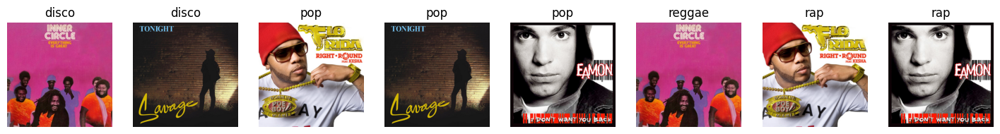

In [ ]:
a = df_total[df_total['name'].duplicated(keep=False)].index
fig = plt.figure(figsize=(18,6))
for i in range(8):
    plt.subplot(1,8, i+1)
    plt.imshow(Image.open(path+'/'+df_total.iloc[a[i]]['genre']+'/'+df_total.iloc[a[i]]['name']))
    plt.title(df_total.iloc[a[i]]['genre'])
    print(df_total.iloc[a[i]]['name'])
    plt.axis('off')

Найденные обложки действительно дубликаты. Но они также расположены в разных жанрах. В связи с тем, что настоящий жанр данных альбомов не известен, они удалены полностью.

In [ ]:
df_total = df_total.drop_duplicates(subset='name', keep=False)
df_total = df_total.reset_index(drop=True)
df_total.shape

(7799, 3)

Также можно поискать дубликаты по размеру файла

In [ ]:
df_total['size'] = df_total.apply(lambda x:os.path.getsize(path+x['genre']+'/'+x['name']), axis=1)

Проверим наличие дубликатов в каждом из жанров и удалим их.

In [ ]:
df_total[df_total['genre']=='anime']['size'].duplicated().sum()

9

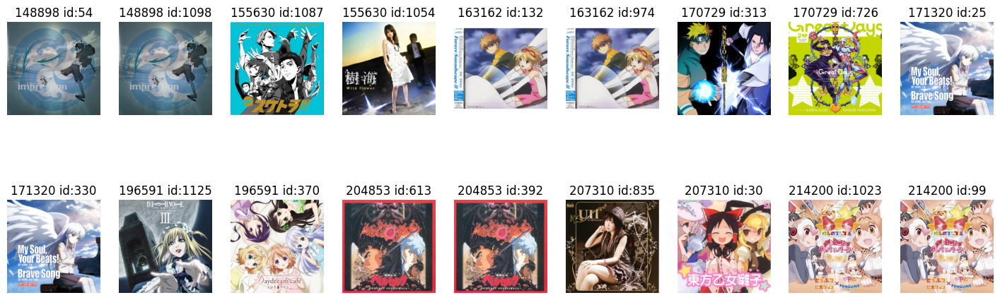

In [ ]:
a = df_total[df_total['genre']=='anime'][df_total[df_total['genre']=='anime']['size'].duplicated(keep=False)].sort_values(by='size').index
fig = plt.figure(figsize=(18,6))
for i in range(18):
    plt.subplot(2,9, i+1)
    plt.imshow(Image.open(path+'/'+df_total.iloc[a[i]]['genre']+'/'+df_total.iloc[a[i]]['name']))
    plt.title(str(df_total.iloc[a[i]]['size'])+' id:'+str(a[i]))
    plt.axis('off')

Не все отмеченные как дубликаты обложки являются в действительности дубликатами. Исходя из количества дубликатов, возможно их удаление в ручном режиме.

In [ ]:
df_total = df_total.drop(index=[54, 132, 25, 613, 1023])
df_total = df_total.reset_index(drop=True)
df_total.shape

(7794, 4)

In [ ]:
df_total[df_total['genre']=='rap']['size'].duplicated().sum()

0

In [ ]:
df_total[df_total['genre']=='black metal']['size'].duplicated().sum()

2

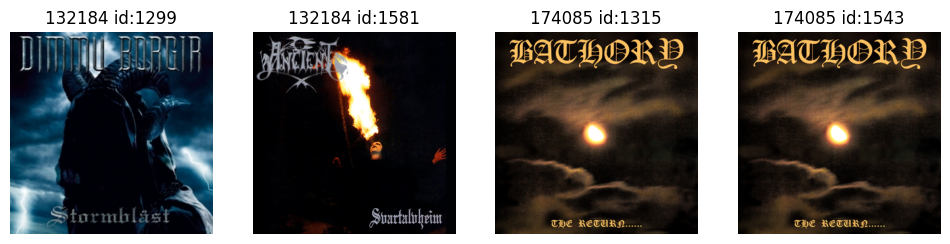

In [ ]:
a = df_total[df_total['genre']=='black metal'][df_total[df_total['genre']=='black metal']['size'].duplicated(keep=False)].sort_values(by='size').index
fig = plt.figure(figsize=(12,6))
for i in range(4):
    plt.subplot(1,4, i+1)
    plt.imshow(Image.open(path+'/'+df_total.iloc[a[i]]['genre']+'/'+df_total.iloc[a[i]]['name']))
    plt.title(str(df_total.iloc[a[i]]['size'])+' id:'+str(a[i]))
    plt.axis('off')

In [ ]:
df_total = df_total.drop(index=[1315])
df_total = df_total.reset_index(drop=True)
df_total.shape

(7793, 4)

In [ ]:
df_total[df_total['genre']=='classical']['size'].duplicated().sum()

5

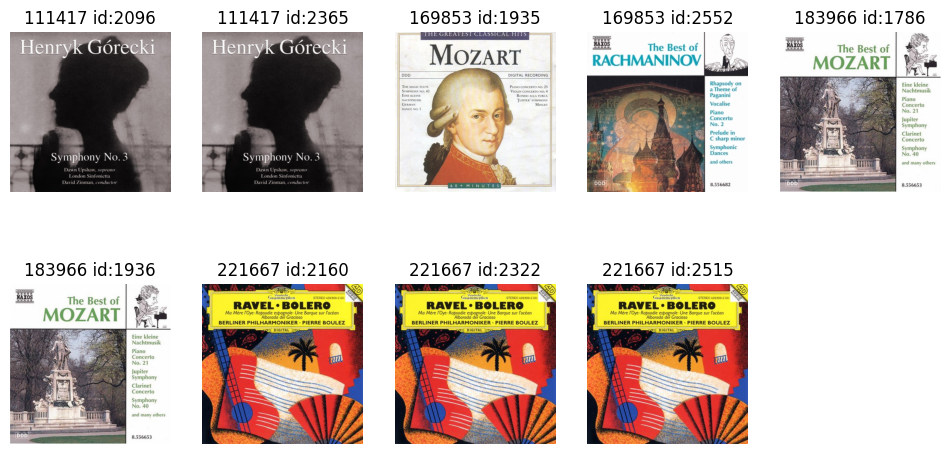

In [ ]:
a = df_total[df_total['genre']=='classical'][df_total[df_total['genre']=='classical']['size'].duplicated(keep=False)].sort_values(by='size').index
fig = plt.figure(figsize=(12,6))
for i in range(9):
    plt.subplot(2,5, i+1)
    plt.imshow(Image.open(path+'/'+df_total.iloc[a[i]]['genre']+'/'+df_total.iloc[a[i]]['name']))
    plt.title(str(df_total.iloc[a[i]]['size'])+' id:'+str(a[i]))
    plt.axis('off')

In [ ]:
df_total = df_total.drop(index=[2096, 1786, 2160, 2322])
df_total = df_total.reset_index(drop=True)
df_total.shape

(7789, 4)

In [ ]:
df_total[df_total['genre']=='country']['size'].duplicated().sum()

7

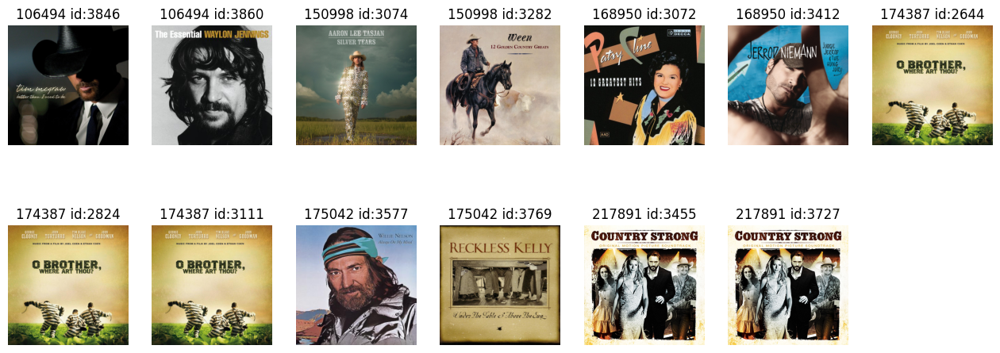

In [ ]:
a = df_total[df_total['genre']=='country'][df_total[df_total['genre']=='country']['size'].duplicated(keep=False)].sort_values(by='size').index
fig = plt.figure(figsize=(16,6))
for i in range(13):
    plt.subplot(2,7, i+1)
    plt.imshow(Image.open(path+'/'+df_total.iloc[a[i]]['genre']+'/'+df_total.iloc[a[i]]['name']))
    plt.title(str(df_total.iloc[a[i]]['size'])+' id:'+str(a[i]))
    plt.axis('off')

In [ ]:
df_total = df_total.drop(index=[2824, 3111, 3455])
df_total = df_total.reset_index(drop=True)
df_total.shape

(7786, 4)

In [ ]:
df_total[df_total['genre']=='disco']['size'].duplicated().sum()

9

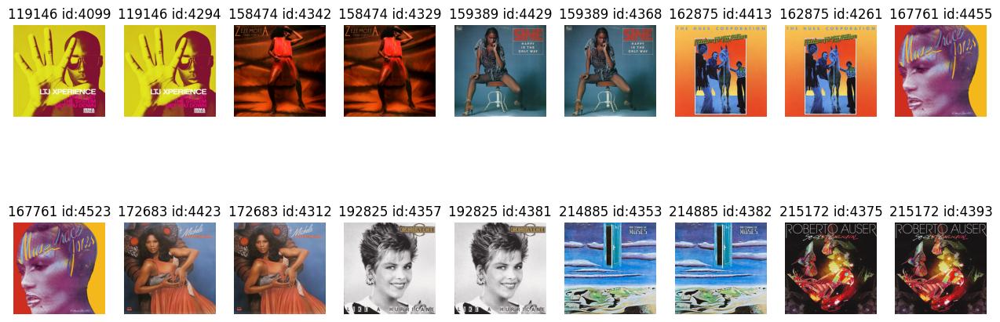

In [ ]:
a = df_total[df_total['genre']=='disco'][df_total[df_total['genre']=='disco']['size'].duplicated(keep=False)].sort_values(by='size').index
fig = plt.figure(figsize=(16,6))
for i in range(18):
    plt.subplot(2,9, i+1)
    plt.imshow(Image.open(path+'/'+df_total.iloc[a[i]]['genre']+'/'+df_total.iloc[a[i]]['name']))
    plt.title(str(df_total.iloc[a[i]]['size'])+' id:'+str(a[i]))
    plt.axis('off')

In [ ]:
df_total = df_total.drop(index=[4099, 4342, 4429, 4413, 4455, 4423, 4357, 4353, 4375])
df_total = df_total.reset_index(drop=True)
df_total.shape

(7777, 4)

In [ ]:
df_total[df_total['genre']=='edm']['size'].duplicated().sum()

17

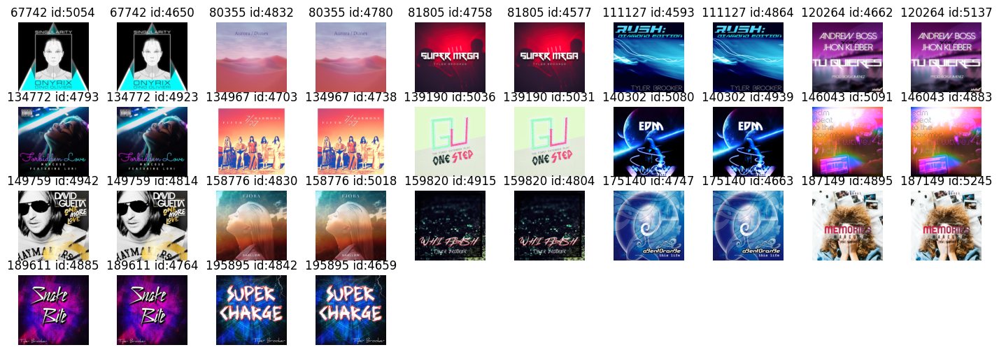

In [ ]:
a = df_total[df_total['genre']=='edm'][df_total[df_total['genre']=='edm']['size'].duplicated(keep=False)].sort_values(by='size').index
fig = plt.figure(figsize=(18,6))
for i in range(34):
    plt.subplot(4,10, i+1)
    plt.imshow(Image.open(path+'/'+df_total.iloc[a[i]]['genre']+'/'+df_total.iloc[a[i]]['name']))
    plt.title(str(df_total.iloc[a[i]]['size'])+' id:'+str(a[i]))
    plt.axis('off')

In [ ]:
a = df_total[df_total['genre']=='edm'][df_total[df_total['genre']=='edm']['size'].duplicated()].index
df_total = df_total.drop(index=a)
df_total = df_total.reset_index(drop=True)
df_total.shape

(7760, 4)

In [ ]:
df_total[df_total['genre']=='jazz']['size'].duplicated().sum()

10

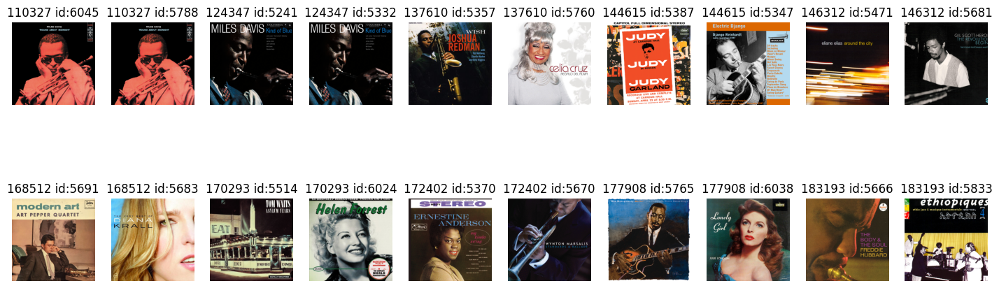

In [ ]:
a = df_total[df_total['genre']=='jazz'][df_total[df_total['genre']=='jazz']['size'].duplicated(keep=False)].sort_values(by='size').index
fig = plt.figure(figsize=(18,6))
for i in range(20):
    plt.subplot(2,10, i+1)
    plt.imshow(Image.open(path+'/'+df_total.iloc[a[i]]['genre']+'/'+df_total.iloc[a[i]]['name']))
    plt.title(str(df_total.iloc[a[i]]['size'])+' id:'+str(a[i]))
    plt.axis('off')

In [ ]:
df_total = df_total.drop(index=[6045,5241])
df_total = df_total.reset_index(drop=True)
df_total.shape

(7758, 4)

In [ ]:
df_total[df_total['genre']=='pop']['size'].duplicated().sum()

8

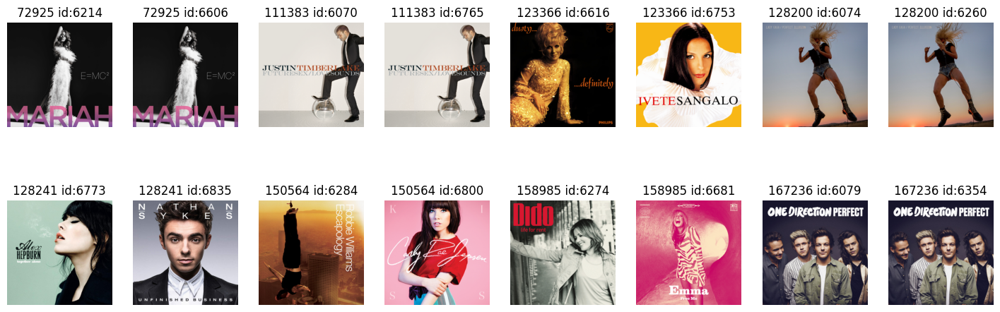

In [ ]:
a = df_total[df_total['genre']=='pop'][df_total[df_total['genre']=='pop']['size'].duplicated(keep=False)].sort_values(by='size').index
fig = plt.figure(figsize=(18,6))
for i in range(16):
    plt.subplot(2,8, i+1)
    plt.imshow(Image.open(path+'/'+df_total.iloc[a[i]]['genre']+'/'+df_total.iloc[a[i]]['name']))
    plt.title(str(df_total.iloc[a[i]]['size'])+' id:'+str(a[i]))
    plt.axis('off')

In [ ]:
df_total = df_total.drop(index=[6214, 6070, 6074, 6079])
df_total = df_total.reset_index(drop=True)
df_total.shape

(7754, 4)

In [ ]:
df_total[df_total['genre']=='reggae']['size'].duplicated().sum()

3

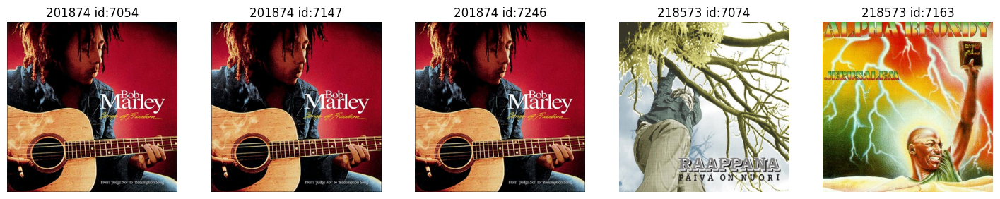

In [ ]:
a = df_total[df_total['genre']=='reggae'][df_total[df_total['genre']=='reggae']['size'].duplicated(keep=False)].sort_values(by='size').index
fig = plt.figure(figsize=(18,6))
for i in range(5):
    plt.subplot(1,5, i+1)
    plt.imshow(Image.open(path+'/'+df_total.iloc[a[i]]['genre']+'/'+df_total.iloc[a[i]]['name']))
    plt.title(str(df_total.iloc[a[i]]['size'])+' id:'+str(a[i]))
    plt.axis('off')

In [ ]:
df_total = df_total.drop(index=[7054, 7147])
df_total = df_total.reset_index(drop=True)
df_total.shape

(7752, 4)

In [ ]:
df_total['tensor'].duplicated().sum()

0

In [ ]:
print('Было удалено 47 дубликатов. В итоге в датафрейме осталось', round(7752/7807, 3),'% файлов')

Было удалено 47 дубликатов. В итоге в датафрейме осталось 0.993 % файлов


Создадим столбцы с размерами изображений и расширением файлов для поиска выбросов

In [ ]:
df_total['xy']= df_total.apply(lambda x:Image.open(path+x['genre']+'/'+x['name']).shape, axis=1)

In [ ]:
df_total['xy'].unique()

array([(300, 300)], dtype=object)

Размер у обложек одинаковый, квадратный.

In [ ]:
df_total['type']= df_total['name'].apply(lambda x:x.split('.')[1])

In [ ]:
df_total['type'].unique()

array(['png'], dtype=object)

Расширение у файлов одинаковое.

In [ ]:
df_total=df_total.drop(['size','xy','type'], axis =1)

# Создание baseline модели

Разделим все файлы на тренировочную и тестовую выборку.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    df_total.drop('genre', axis=1),
    df_total['genre'],
    test_size = TEST_SIZE,
    random_state = RANDOM_STATE,
    stratify = df_total['genre'])

In [ ]:
X_train = X_train.reset_index(drop=True)
X_train.shape

(6201, 2)

In [ ]:
X_train_array = np.stack(X_train['tensor'])
X_train_array.shape

(6201, 2048)

In [ ]:
y_train = y_train.reset_index(drop=True)
y_train.shape

(6201,)

In [ ]:
X_test = X_test.reset_index(drop = True)
X_test.shape

(1551, 2)

In [ ]:
X_test_array = np.stack(X_test['tensor'])
X_test_array.shape

(1551, 2048)

In [ ]:
y_test = y_test.reset_index(drop=True)
y_test.shape

(1551,)

Рассчитаем схожесть векторов

In [ ]:
index = faiss.IndexFlatL2(2048)
index.add(X_train_array)
print(index.ntotal)

6201


In [ ]:
_, I = index.search(X_test_array, 5)

In [ ]:
fiass_df = pd.DataFrame(I)
fiass_df[0] =fiass_df[0].apply(lambda x:y_train[x])
fiass_df[1] =fiass_df[1].apply(lambda x:y_train[x])
fiass_df[2] =fiass_df[2].apply(lambda x:y_train[x])
fiass_df[3] =fiass_df[3].apply(lambda x:y_train[x])
fiass_df[4] =fiass_df[4].apply(lambda x:y_train[x])
fiass_df['pred'] = fiass_df.mode(axis =1)[0]
fiass_df = fiass_df.join(y_test.to_frame())
fiass_df.head(10)

,0,1,2,3,4,pred,genre
0,country,pop,anime,country,pop,country,country
1,classical,classical,classical,classical,classical,classical,classical
2,black metal,black metal,reggae,black metal,black metal,black metal,black metal
3,edm,country,reggae,disco,edm,edm,edm
4,anime,country,jazz,pop,pop,pop,pop
5,country,country,country,country,country,country,country
6,anime,anime,anime,anime,anime,anime,anime
7,anime,anime,anime,anime,anime,anime,anime
8,country,country,pop,jazz,jazz,country,rap
9,country,country,country,country,reggae,country,country


In [ ]:
print('Метрика accuracy для fiass:', round(accuracy_score(fiass_df['genre'], fiass_df['pred']),3))

Метрика accuracy для fiass: 0.512


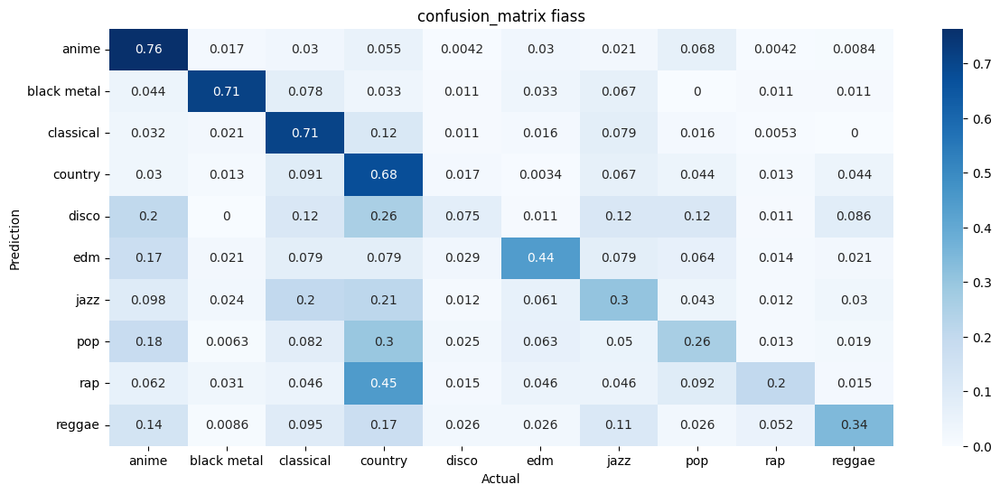

In [ ]:
cm = confusion_matrix(fiass_df['genre'], fiass_df['pred'])
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(14,6))
sns.heatmap(cmn, annot=True, cmap = 'Blues',
            xticklabels=sorted(fiass_df['genre'].unique()),
            yticklabels=sorted(fiass_df['genre'].unique()))
plt.title('confusion_matrix fiass')
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.show()

In [ ]:
def test(a):
    print('Проверяемая картинка:')
    plt.imshow(Image.open(path+a))
    plt.show()
    img = Image.open('drive/MyDrive/cover/'+a).convert('RGB')
    img1 = transform(img)
    x = torch.unsqueeze(img1, dim=0)
    y = resnet50(x).detach().numpy()
    z = y.reshape(1,2048)
    D, I = index.search(z, 5)
    one_df = pd.DataFrame(I)
    fig = plt.figure(figsize=(14,6))
    for i in range(5):
        plt.subplot(1,5,i+1)
        plt.imshow(Image.open(path+y_train.iloc[one_df[i][0]]+'/'+X_train.iloc[one_df[i][0]]['name']))
        plt.title(y_train.iloc[one_df[i][0]])
        plt.axis('off')
    one_df[0] =one_df[0].apply(lambda x:y_train[x])
    one_df[1] =one_df[1].apply(lambda x:y_train[x])
    one_df[2] =one_df[2].apply(lambda x:y_train[x])
    one_df[3] =one_df[3].apply(lambda x:y_train[x])
    one_df[4] =one_df[4].apply(lambda x:y_train[x])
    print('Предсказанный жанр:',one_df.mode(axis=1)[0][0])
    print('Ближайшие соседи:')

Проверяемая картинка:


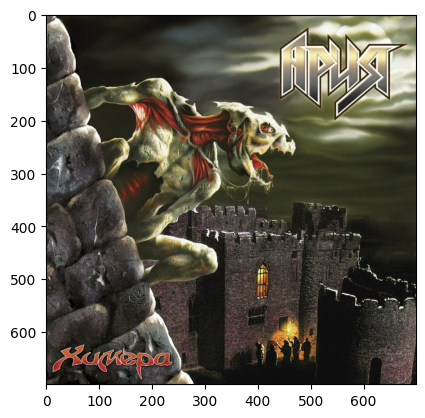

Предсказанный жанр: anime
Ближайшие соседи:


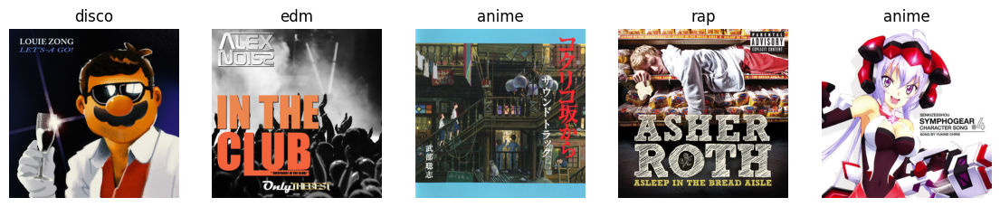

In [ ]:
test('Aria-Chimera.png')

Модель не выявила правильный результат. Среди ближайших соседей его тоже нет. Результат неудовлетворительный.  

Проверяемая картинка:


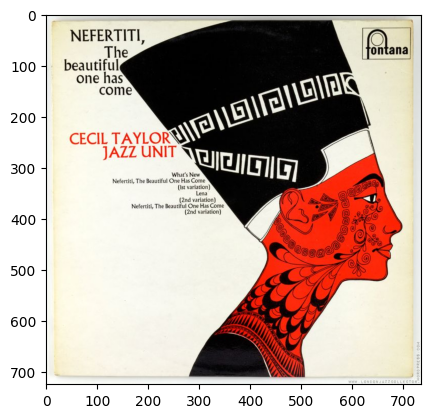

Предсказанный жанр: classical
Ближайшие соседи:


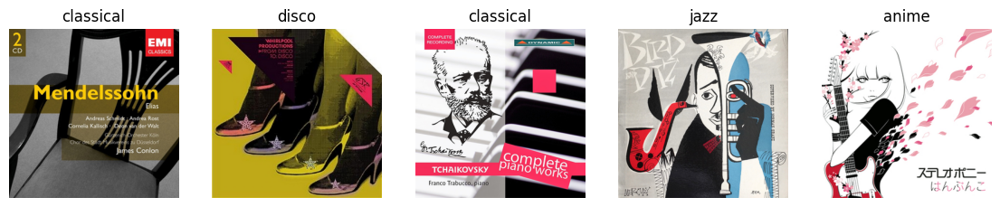

In [ ]:
test('test_2.png')

Модель неправильно определила жанр. Только один из соседей имеет правильный жанр.

Проверяемая картинка:


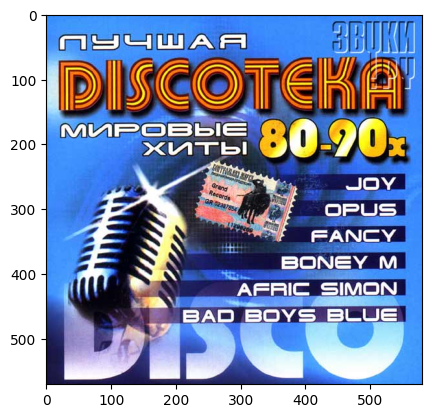

Предсказанный жанр: edm
Ближайшие соседи:


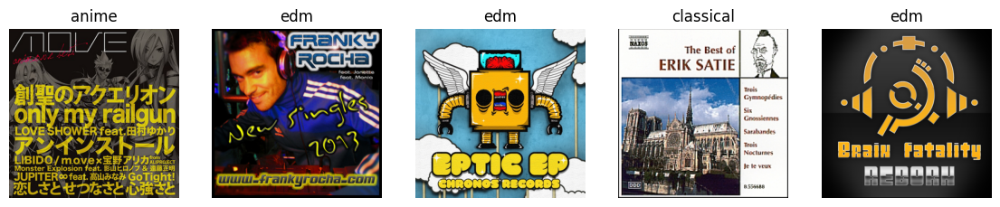

In [ ]:
test('20467.png')

Модель неправильно определила жанр. Правильного соседа не обнаружено.

<u>Вывод по baseline модели: </u> Исходя из того, что в выборке 10 жанров, accuracy 0.51 неплохой результат для модели без обучения. Модель неплохо предсказывает аниме, классическую музыку,black metal и  country, на остальных жанрах матрика близка к 0.5 либо существенно ниже. Диско-музыку модель фактически не предсказывает, много обложек ошибочно относит к country. Из трех тестовых картинок правильно жанр не был определен ни на одной, что указывает на плохую работоспособность модели.

# Обучение модели с помощью fastai

Загрузим данные

In [ ]:
df_total['path']=df_total.apply(lambda x: x['genre']+'/'+x['name'], axis =1)

In [ ]:
path = 'drive/MyDrive/cover'

In [ ]:
dls = ImageDataLoaders.from_df (df_total[['path','genre']], path,
                               valid_pct=0.2, bs=64, seed=None, vocab=None,
                               item_tfms=None, batch_tfms=aug_transforms(max_rotate=20, max_warp=0.4),
                               device=None)

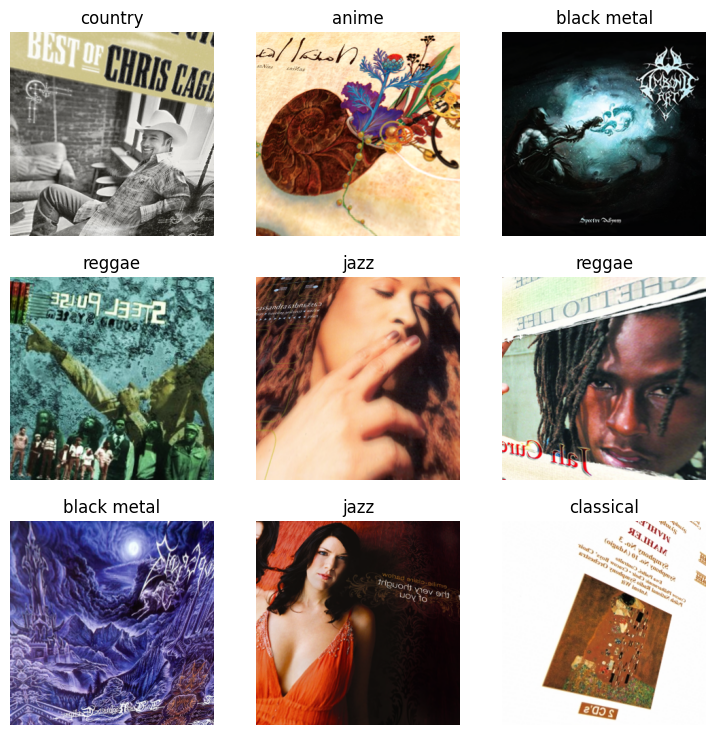

In [ ]:
dls.show_batch(max_n=9)

Обучим модель на 8 эпохах

In [ ]:
learn = vision_learner(dls, resnet50, metrics=[accuracy, Precision(average='weighted'),
                                Recall(average='weighted'), F1Score(average='weighted')])
learn.fine_tune(8)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 173MB/s]


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.091789,1.380238,0.599355,0.601310,0.599355,0.594354,59:48


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.290278,1.090814,0.651613,0.653716,0.651613,0.649453,02:16
1,1.092497,1.011798,0.672903,0.675790,0.672903,0.670787,02:16
2,0.906214,0.996140,0.681935,0.679766,0.681935,0.676893,02:16
3,0.698071,0.952878,0.692903,0.686432,0.692903,0.688365,02:16
4,0.520839,0.931247,0.709677,0.712562,0.709677,0.707563,02:16
5,0.399673,0.914109,0.707742,0.704178,0.707742,0.704243,02:16
6,0.316197,0.920888,0.717419,0.719762,0.717419,0.715889,02:16
7,0.281170,0.917790,0.713548,0.709025,0.713548,0.709135,02:16


Модель достигла своего максимума на 6 эпохе. После этого видно, что несмотря на рост метрик, модель начала переобучаться, на что показывает рост ошибки valid_loss. Метрика accuracy совпадает с метрикой recall, при этом все метики одинаково растут/падают. Это указывает на сбалансированность модели при определении жанра. Дальнейшее обучение модели приведет к улучшению предсказаний одной части жанров за счет ухудшения предсказаний другой части жанров. Модель тем самым будет подсраиваться под одни, многочасленные жанры, игнорируя иные.       

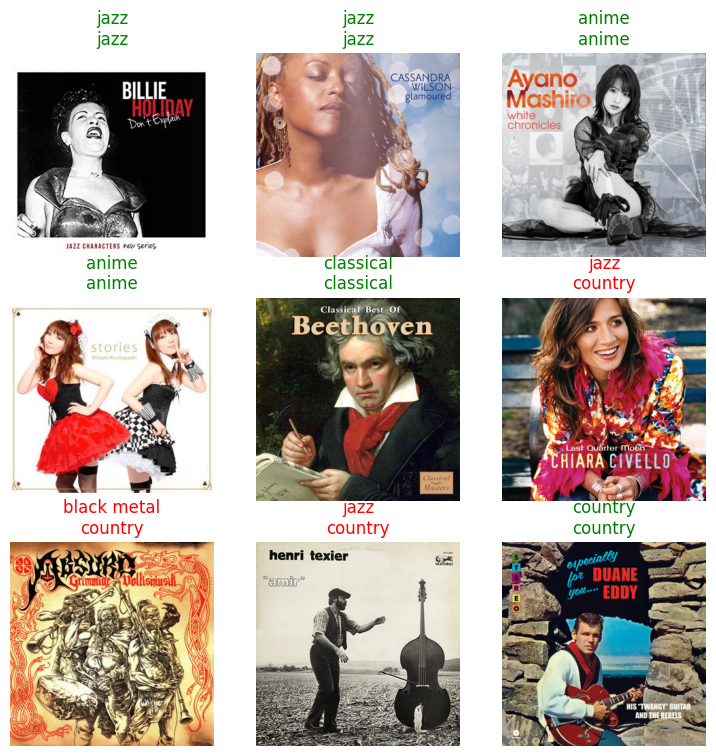

In [ ]:
learn.show_results()

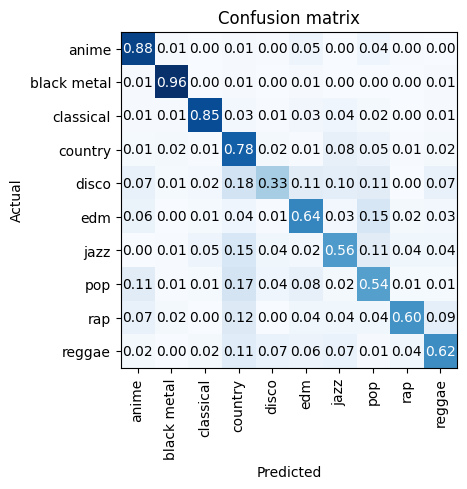

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(normalize=True)

Медель хорошо предсказывает anime, bleak metal и классическую музыку. Плохие показатели по правильным ответам у диско музыки. Возможно, влияет как размер выборки, так и цветовое отличие самих постеров. Bleaсk mеtal, насмотря на небольшую выборку, имеет темную и резкую палитру, что сильно отличается от иных направлений, что и дает 0.96 процента правильных ответов. Показатели по всем жанрам лучше, что у fiass модели без обучения.

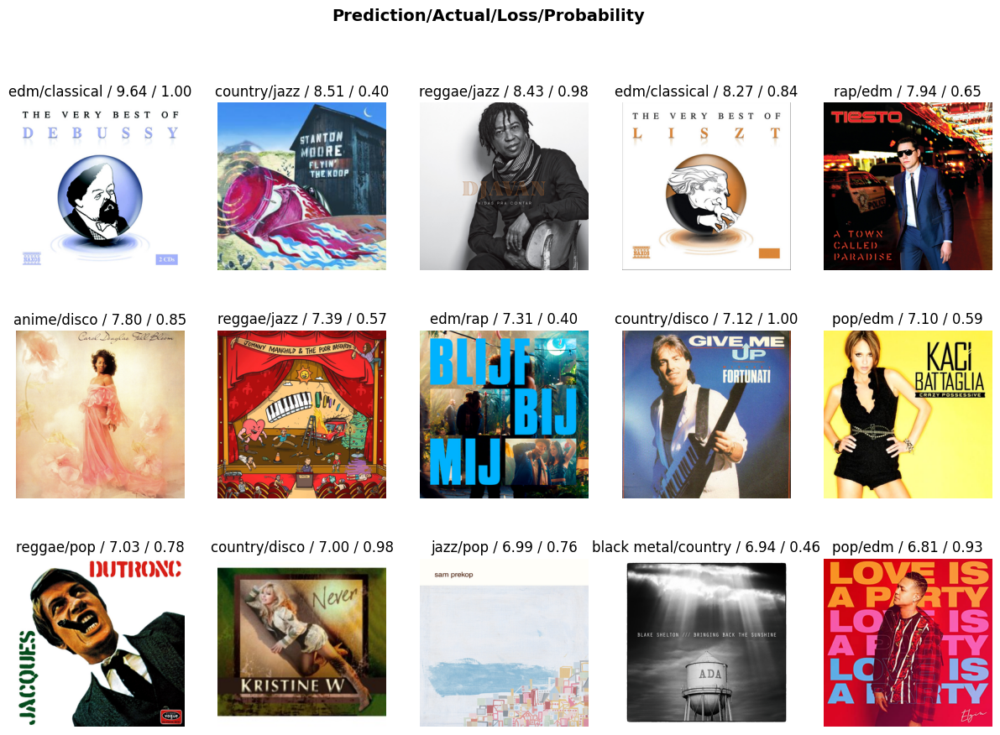

In [ ]:
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(15, figsize=(15,10))

Ожидаемо, большие ошибки при определении жанра disco. Также плохие показатели у конкретных обложек у country.

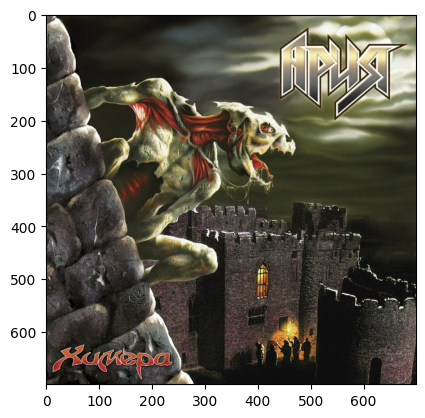

Предсказанный жанр:  black metal


In [ ]:
plt.imshow(Image.open(path+'/'+'Aria-Chimera.png'))
plt.show()
a = learn.predict(path+'/'+'Aria-Chimera.png')
print('Предсказанный жанр: ',a[0])

Жанр определен правильно.

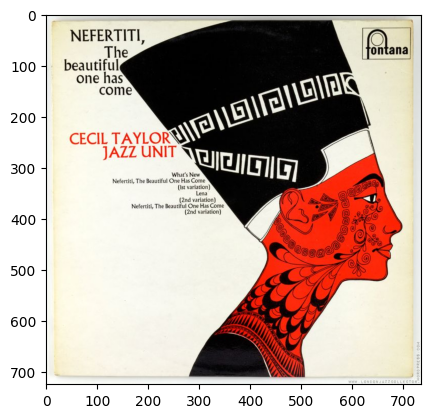

Предсказанный жанр:  jazz


In [ ]:
plt.imshow(Image.open(path+'/'+'test_2.png'))
plt.show()
a = learn.predict(path+'/'+'test_2.png')
print('Предсказанный жанр: ',a[0])

Жанр определен правильно.

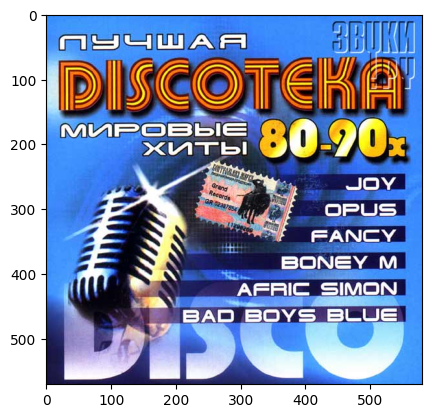

Предсказанный жанр:  disco


In [ ]:
plt.imshow(Image.open(path+'/'+'20467.png'))
plt.show()
a = learn.predict(path+'/'+'20467.png')
print('Предсказанный жанр: ',a[0])

Жанр определен правильно.

# Вывод:

В данном проекте была создана модель, классифицирующая обложки музыкальных дисков по жанрам.

В проекте использовалось 7800 обложек, заранее разобранных по жанрам, создана модель fiass без обучения, а также нейронная сеть с использованием библотеки fastai. В результате обучения возникли следующие показатели:
- Метрика accuracy на fiass модели - 0.51, нейронная сеть показала метрику - 0.71.
- Процент правильных ответов на всех жанрах лучше у нейронной сети.
- Хорошо определяемые жанры у моделей примерно одинаковы. Плохо определяется disco, хорошо - аниме, металл и классическая музыка.
- Fiass-модель не смогла определить жанр трех рандомных картинок, нейронная сеть с этим справилась.

Созданная модель может быть улучшена увеличением размера тренировочной выборки, добавлением новых жанров для классификации.